<a href="https://colab.research.google.com/github/Peheppy/YOLO-Coin-Detector/blob/main/Count_Coins.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Initial Setup

## Install Dependencies

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 20.1 MB/s eta 0:00:00


## Import Libraries

In [2]:
import os
import glob
import pandas as pd
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2

from google.colab import drive
drive.mount('/content/drive')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Mounted at /content/drive


# Coin Detection Utilities

## Define Classes Values

In [12]:
coin_values = {
    "cinco_centavos_bronze": 0.05,
    "cinco_centavos_cinza": 0.05,
    "cinquenta_centavos_fino": 0.50,
    "cinquenta_centavos_grosso": 0.50,
    "dez_centavos_bronze": 0.10,
    "dez_centavos_cinza": 0.10,
    "um_real": 1.00,
    "vintecinco_centavos_bronze": 0.25,
    "vintecinco_centavos_cinza": 0.25,
}

## Detection Functions

In [13]:
def show_image(img, title=""):
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    if title:
        plt.title(title)
    plt.show()

In [14]:
def process_image(image_path, show=True):
    img = cv2.imread(image_path)
    height, width = img.shape[:2]

    results = model(img)
    detections = results[0].boxes

    total_value = 0.0
    detected_coins = []

    font_scale = max(width, height) / 640 * 0.6
    thickness = max(1, int(font_scale * 2))

    for box in detections:
        cls_id = int(box.cls.cpu().numpy()[0])
        class_name = model.names[cls_id]
        detected_coins.append(class_name)
        total_value += coin_values.get(class_name, 0)

        x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img, class_name, (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 255, 0), thickness)

    if show:
        show_image(img, title=f"{os.path.basename(image_path)} - Total: R$ {total_value:.2f}")

    return detected_coins, total_value, img

In [15]:
def process_video(video_path, output_folder="processed_videos", show_interval=60):
    os.makedirs(output_folder, exist_ok=True)

    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)

    out_path = os.path.join(output_folder, os.path.basename(video_path))
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(out_path, fourcc, fps, (width, height))

    total_video_value = 0.0
    frame_count = 0

    while True:
        ret, frame = cap.read()
        if not ret:
            break

        results = model(frame)
        detections = results[0].boxes

        font_scale = max(width, height) / 640 * 0.6
        thickness = max(1, int(font_scale*2))
        frame_value = 0.0

        for box in detections:
            cls_id = int(box.cls.cpu().numpy()[0])
            class_name = model.names[cls_id]
            frame_value += coin_values.get(class_name, 0)

            x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, class_name, (x1, y1-10),
                        cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 255, 0), thickness)

        total_video_value += frame_value
        frame_count += 1
        out.write(frame)

        # Mostrar a cada 60 frames
        if frame_count % show_interval == 0:
            show_image(frame, title=f"Frame {frame_count} - Total: R$ {frame_value:.2f}")

    cap.release()
    out.release()
    avg_value = total_video_value / max(frame_count, 1)
    print(f"✅ {os.path.basename(video_path)} -> Average value per frame: R$ {avg_value:.2f}")
    print(f"🎥 Processed video saved at: {out_path}")
    return out_path, avg_value

# Upload Model and Data

## Model

In [6]:
model_path = "/content/drive/MyDrive/Projetos/YOLO-Coin/best.pt"
model = YOLO(model_path)

## Data

In [7]:
input_folder = "/content/drive/MyDrive/Projetos/YOLO-Coin/test_images"
image_exts = ["*.jpg", "*.jpeg", "*.png"]

all_images = []
for ext in image_exts:
    all_images.extend(glob.glob(os.path.join(input_folder, ext)))

print(f"📂 {len(all_images)} images found in {input_folder}")

📂 9 images found in /content/drive/MyDrive/Projetos/YOLO-Coin/test_images


In [8]:
video_folder = "/content/drive/MyDrive/Projetos/YOLO-Coin/test_videos"
video_exts = ["*.mp4", "*.avi", "*.mov"]

all_videos = []
for ext in video_exts:
    all_videos.extend(glob.glob(os.path.join(video_folder, ext)))

print(f"\n📂 {len(all_videos)} videos found in {video_folder}")


📂 1 videos found in /content/drive/MyDrive/Projetos/YOLO-Coin/test_videos


# Model Detection

## Process and Analyze Images

📂 9 images found in /content/drive/MyDrive/Projetos/YOLO-Coin/test_images

0: 640x480 1 cinco_centavos_bronze, 1 cinco_centavos_cinza, 1 cinquenta_centavos_grosso, 9 dez_centavos_bronzes, 2 um_reals, 3 vintecinco_centavos_bronzes, 1 vintecinco_centavos_cinza, 467.5ms
Speed: 12.7ms preprocess, 467.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


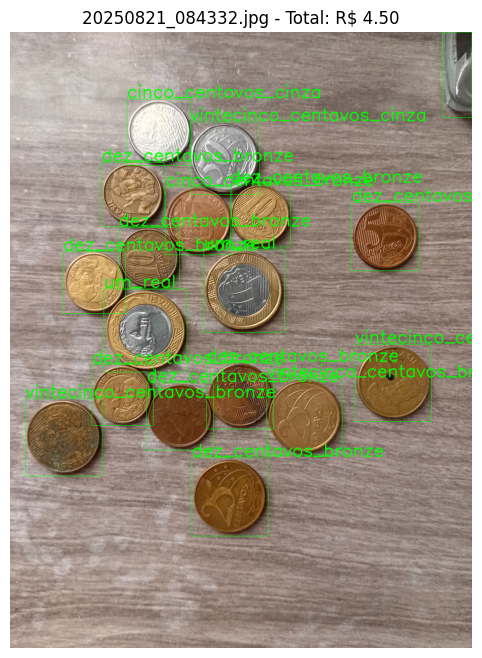


0: 480x640 1 cinco_centavos_bronze, 1 cinco_centavos_cinza, 1 cinquenta_centavos_grosso, 11 dez_centavos_bronzes, 3 um_reals, 4 vintecinco_centavos_bronzes, 1 vintecinco_centavos_cinza, 413.4ms
Speed: 6.0ms preprocess, 413.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


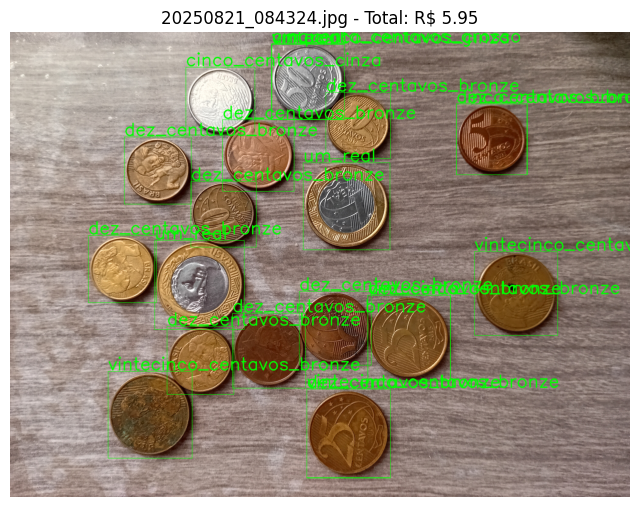


0: 480x640 2 cinco_centavos_bronzes, 4 cinco_centavos_cinzas, 5 cinquenta_centavos_grossos, 6 dez_centavos_bronzes, 1 um_real, 3 vintecinco_centavos_bronzes, 414.7ms
Speed: 5.7ms preprocess, 414.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


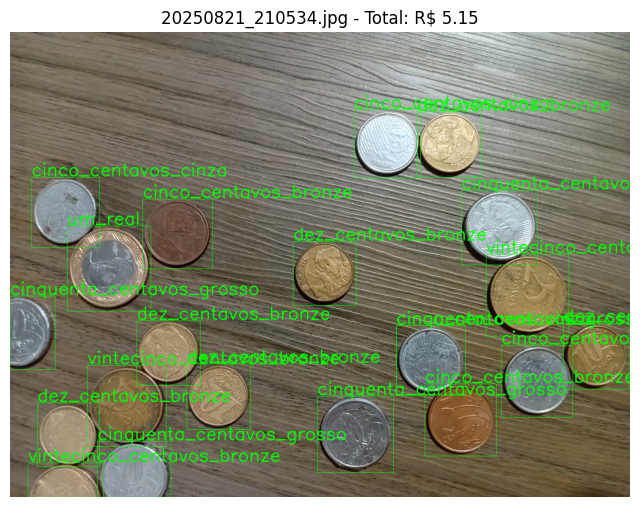


0: 480x640 2 cinco_centavos_bronzes, 3 cinco_centavos_cinzas, 4 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 3 vintecinco_centavos_bronzes, 411.4ms
Speed: 10.9ms preprocess, 411.4ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


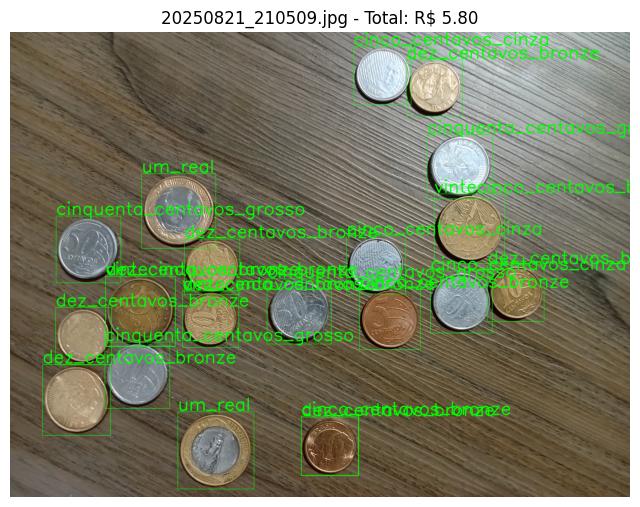


0: 480x640 3 cinco_centavos_bronzes, 2 cinco_centavos_cinzas, 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 2 um_reals, 1 vintecinco_centavos_bronze, 439.0ms
Speed: 6.1ms preprocess, 439.0ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


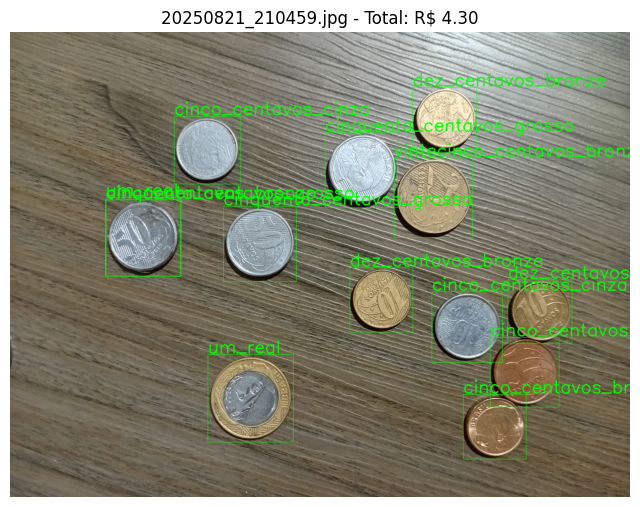


0: 480x640 3 cinco_centavos_bronzes, 3 cinco_centavos_cinzas, 7 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 635.0ms
Speed: 7.0ms preprocess, 635.0ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


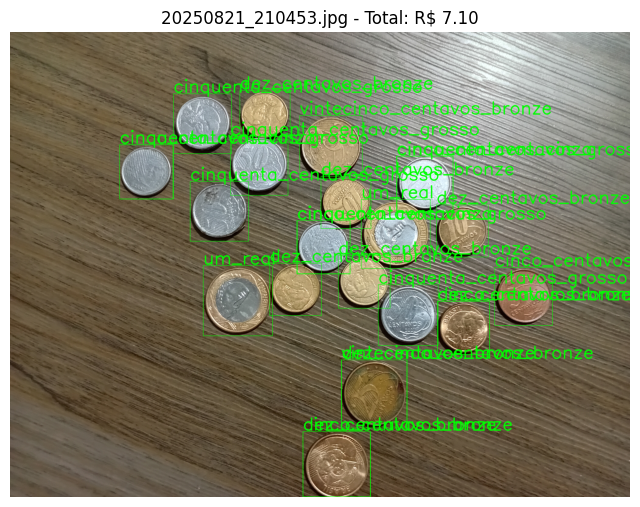


0: 480x640 1 cinco_centavos_bronze, 5 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 432.0ms
Speed: 5.2ms preprocess, 432.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


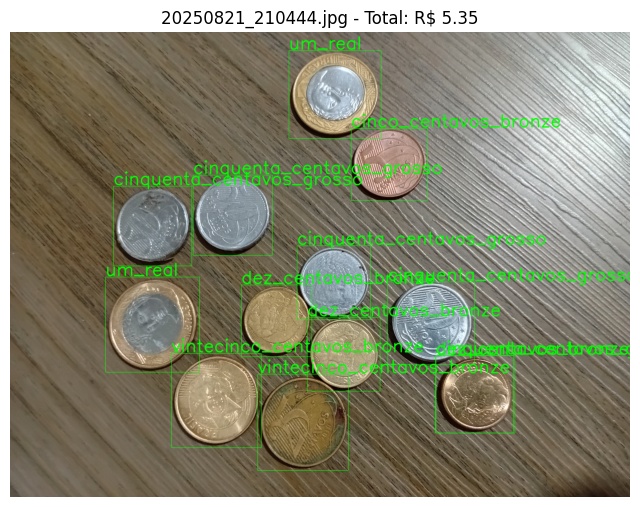


0: 480x640 1 cinco_centavos_bronze, 5 cinco_centavos_cinzas, 6 dez_centavos_bronzes, 3 um_reals, 3 vintecinco_centavos_bronzes, 446.3ms
Speed: 5.4ms preprocess, 446.3ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


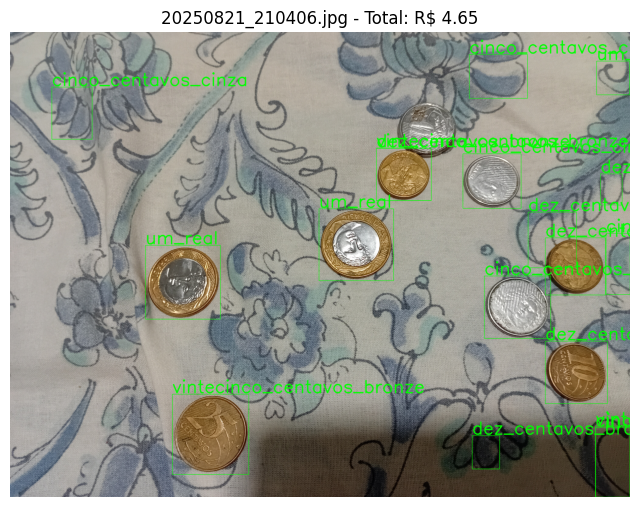


0: 480x640 6 cinco_centavos_cinzas, 5 dez_centavos_bronzes, 3 um_reals, 4 vintecinco_centavos_bronzes, 468.8ms
Speed: 5.4ms preprocess, 468.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


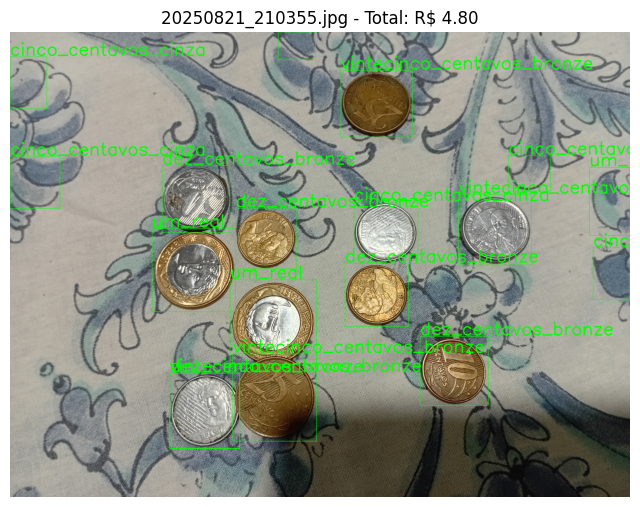


✅ Report saved at coins_report.csv


,image,detected_coins,total_value
0,20250821_084332.jpg,"um_real, um_real, dez_centavos_bronze, dez_cen...",4.50
1,20250821_084324.jpg,"um_real, um_real, dez_centavos_bronze, cinco_c...",5.95
2,20250821_210534.jpg,"cinco_centavos_bronze, um_real, cinco_centavos...",5.15
3,20250821_210509.jpg,"dez_centavos_bronze, dez_centavos_bronze, dez_...",5.80
4,20250821_210459.jpg,"um_real, cinco_centavos_bronze, dez_centavos_b...",4.30
5,20250821_210453.jpg,"dez_centavos_bronze, um_real, um_real, cinquen...",7.10
6,20250821_210444.jpg,"cinco_centavos_bronze, um_real, um_real, dez_c...",5.35
7,20250821_210406.jpg,"um_real, um_real, cinco_centavos_cinza, vintec...",4.65
8,20250821_210355.jpg,"um_real, um_real, vintecinco_centavos_bronze, ...",4.80


In [16]:
image_exts = ["*.jpg", "*.jpeg", "*.png"]
all_images = []
for ext in image_exts:
    all_images.extend(glob.glob(os.path.join(input_folder, ext)))

print(f"📂 {len(all_images)} images found in {input_folder}")

results_data = []
for img_path in all_images:
    coins, total, img_with_boxes = process_image(img_path)
    results_data.append({
        "image": os.path.basename(img_path),
        "detected_coins": ", ".join(coins),
        "total_value": round(total, 2)
    })

df = pd.DataFrame(results_data)
csv_path = "coins_report.csv"
df.to_csv(csv_path, index=False, encoding="utf-8-sig")
print(f"\n✅ Report saved at {csv_path}")
display(df)

## Process and Analyze Videos


📂 1 videos found in /content/drive/MyDrive/Projetos/YOLO-Coin/test_videos

0: 384x640 2 cinco_centavos_bronzes, 2 cinco_centavos_cinzas, 8 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 658.2ms
Speed: 10.7ms preprocess, 658.2ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 6 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 466.1ms
Speed: 5.5ms preprocess, 466.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 8 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 342.1ms
Speed: 4.4ms preprocess, 342.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 7 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 2 um_reals, 

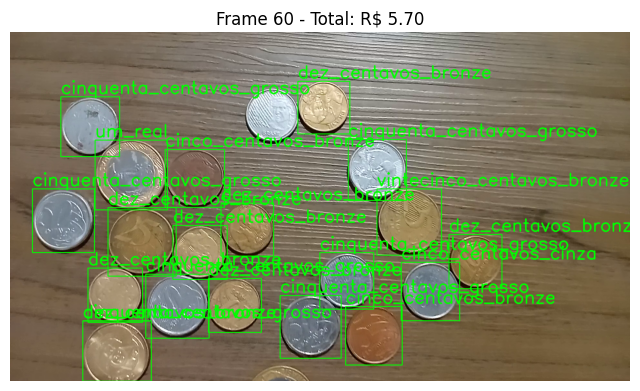


0: 384x640 2 cinco_centavos_bronzes, 6 cinquenta_centavos_grossos, 10 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 368.1ms
Speed: 8.5ms preprocess, 368.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 8 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 370.1ms
Speed: 5.0ms preprocess, 370.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 8 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 342.1ms
Speed: 3.9ms preprocess, 342.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 7 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 361.7ms
Speed: 4.3ms preprocess, 361.7ms inference, 1.2ms postprocess pe

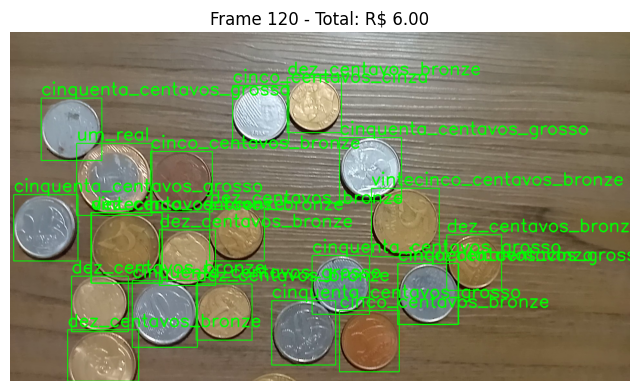


0: 384x640 2 cinco_centavos_bronzes, 7 cinquenta_centavos_grossos, 10 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 380.5ms
Speed: 3.7ms preprocess, 380.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 6 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 325.1ms
Speed: 5.1ms preprocess, 325.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 2 cinco_centavos_cinzas, 6 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 336.6ms
Speed: 3.7ms preprocess, 336.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 6 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 336.3ms
Speed: 4.2ms preprocess, 336.3ms inference, 1.0ms postprocess pe

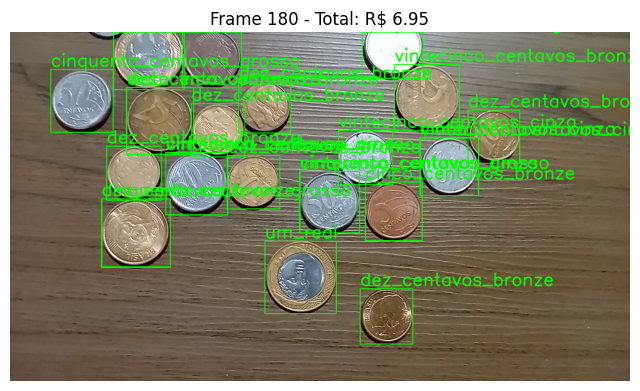


0: 384x640 2 cinco_centavos_bronzes, 7 cinquenta_centavos_grossos, 7 dez_centavos_bronzes, 3 um_reals, 2 vintecinco_centavos_bronzes, 3 vintecinco_centavos_cinzas, 387.3ms
Speed: 3.8ms preprocess, 387.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 6 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 3 um_reals, 2 vintecinco_centavos_bronzes, 2 vintecinco_centavos_cinzas, 335.9ms
Speed: 7.0ms preprocess, 335.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 7 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 3 vintecinco_centavos_cinzas, 363.1ms
Speed: 5.6ms preprocess, 363.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 7 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 3 um_reals, 2 vintecinco_centavos_bronzes, 3 vintecinco_centavos_cinzas, 339.2ms
Speed: 4.0ms p

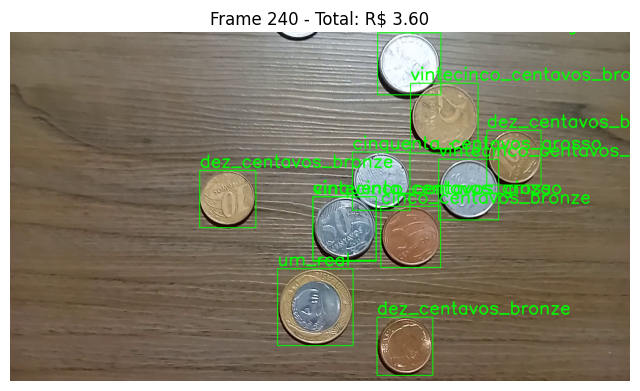


0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 534.0ms
Speed: 3.8ms preprocess, 534.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 518.8ms
Speed: 5.6ms preprocess, 518.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 331.5ms
Speed: 5.3ms preprocess, 331.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 339.8ms
Speed: 7.6ms preprocess, 3

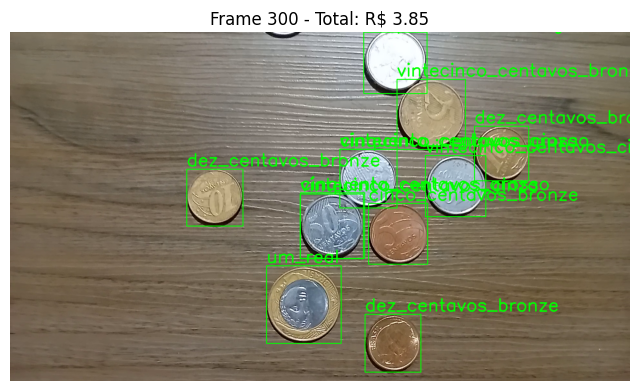


0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 493.9ms
Speed: 7.8ms preprocess, 493.9ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 4 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 479.0ms
Speed: 3.8ms preprocess, 479.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 4 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 2 vintecinco_centavos_cinzas, 527.9ms
Speed: 7.0ms preprocess, 527.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 3 vintecinco_centavos_cinzas, 541.6ms
Speed: 3.7ms preprocess, 5

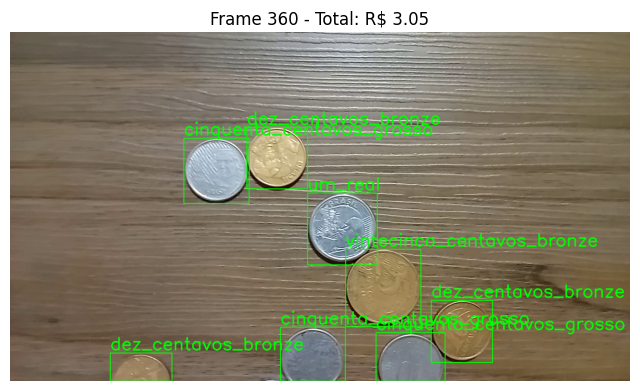


0: 384x640 4 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 375.0ms
Speed: 3.8ms preprocess, 375.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_cinza, 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 2 um_reals, 1 vintecinco_centavos_bronze, 356.6ms
Speed: 4.0ms preprocess, 356.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 367.5ms
Speed: 3.9ms preprocess, 367.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 2 um_reals, 1 vintecinco_centavos_bronze, 337.5ms
Speed: 4.9ms preprocess, 337.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_cinza, 3 cinquenta_centavos_grossos

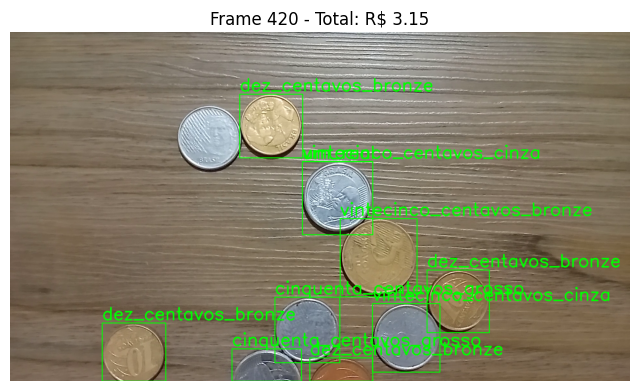


0: 384x640 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 360.2ms
Speed: 3.6ms preprocess, 360.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 397.2ms
Speed: 3.8ms preprocess, 397.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 371.0ms
Speed: 3.7ms preprocess, 371.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 394.9ms
Speed: 3.9ms preprocess, 394.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 cinquenta_centavos

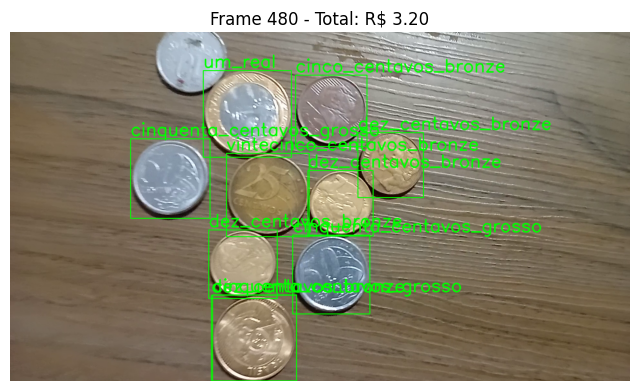


0: 384x640 1 cinco_centavos_bronze, 1 cinco_centavos_cinza, 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 369.3ms
Speed: 4.0ms preprocess, 369.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 332.7ms
Speed: 13.6ms preprocess, 332.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 4 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 2 vintecinco_centavos_cinzas, 366.9ms
Speed: 3.8ms preprocess, 366.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 3 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 2 vintecinco_centavos_bronzes, 2 vintecinco_centavos_cinzas, 347.2ms
Speed: 4.0ms preprocess, 347.2ms inference, 1.1ms postproc

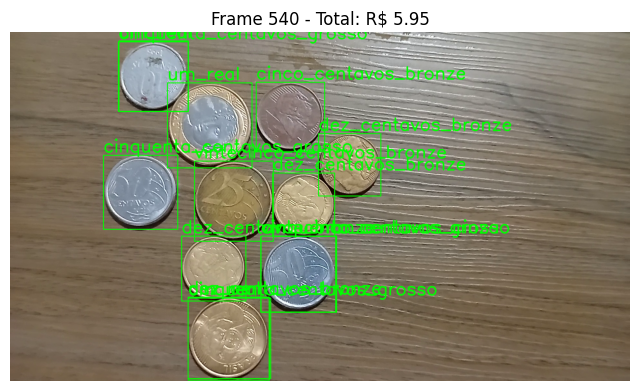


0: 384x640 1 cinco_centavos_bronze, 4 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 401.9ms
Speed: 3.9ms preprocess, 401.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 4 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 363.5ms
Speed: 5.6ms preprocess, 363.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 5 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 362.4ms
Speed: 4.1ms preprocess, 362.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 4 cinquenta_centavos_grossos, 4 dez_centavos_bronzes, 1 um_real, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 386.2ms
Speed: 3.9ms preprocess, 386.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco

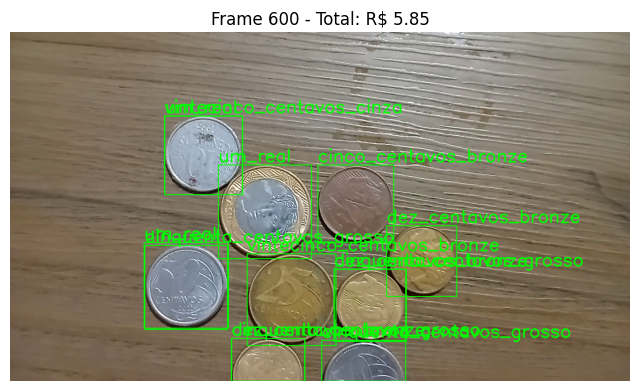


0: 384x640 1 cinco_centavos_bronze, 2 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 3 um_reals, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 425.9ms
Speed: 3.7ms preprocess, 425.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 2 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 2 um_reals, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 418.0ms
Speed: 4.0ms preprocess, 418.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 2 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 3 um_reals, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 405.8ms
Speed: 3.8ms preprocess, 405.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 2 cinquenta_centavos_grossos, 3 dez_centavos_bronzes, 3 um_reals, 1 vintecinco_centavos_bronze, 1 vintecinco_centavos_cinza, 391.2ms
Speed: 3.9ms preprocess, 3

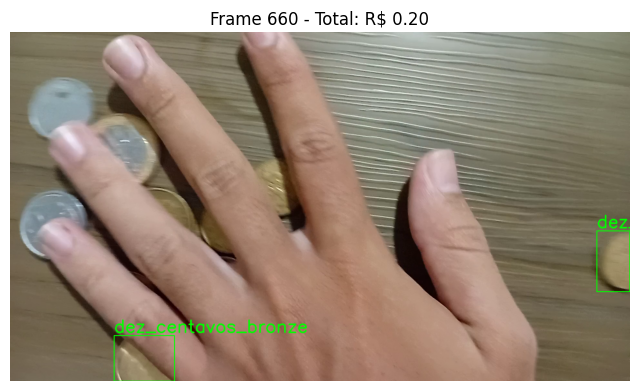


0: 384x640 3 dez_centavos_bronzes, 1 um_real, 413.3ms
Speed: 4.2ms preprocess, 413.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinquenta_centavos_grossos, 1 dez_centavos_bronze, 1 um_real, 401.9ms
Speed: 3.8ms preprocess, 401.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinquenta_centavos_grosso, 1 dez_centavos_bronze, 395.7ms
Speed: 11.0ms preprocess, 395.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinquenta_centavos_grossos, 1 dez_centavos_bronze, 427.3ms
Speed: 5.3ms preprocess, 427.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinquenta_centavos_grossos, 1 dez_centavos_bronze, 381.9ms
Speed: 4.1ms preprocess, 381.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinquenta_centavos_grossos, 1 dez_centavos_bronze, 1 um_real, 413.0ms
Speed: 4.2ms preprocess, 413.0ms inference, 1.0ms postprocess per im

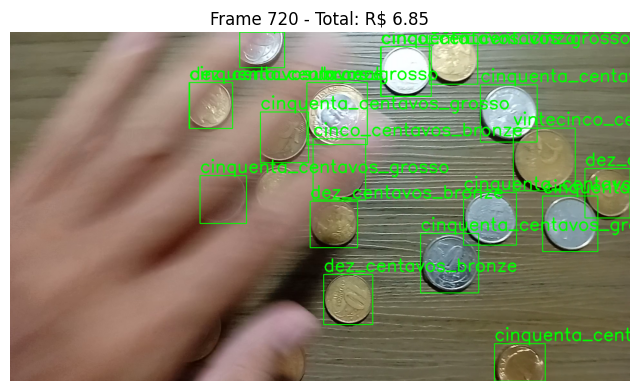


0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 8 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 382.5ms
Speed: 4.2ms preprocess, 382.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 11 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 1 um_real, 4 vintecinco_centavos_bronzes, 380.2ms
Speed: 3.9ms preprocess, 380.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 10 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 388.2ms
Speed: 5.3ms preprocess, 388.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 10 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 2 um_reals, 1 vintecinco_centavos_bronze, 362.4ms
Speed: 5.4ms preprocess, 362.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2

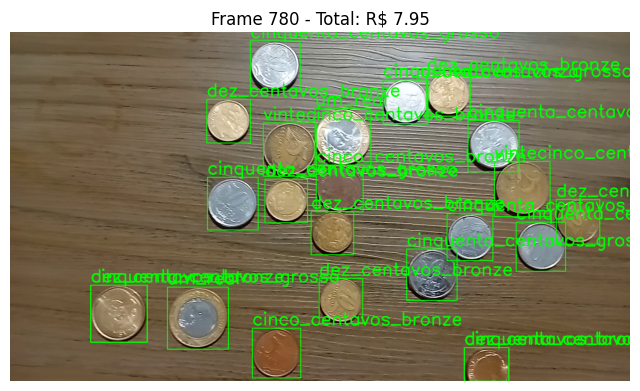


0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 9 cinquenta_centavos_grossos, 9 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 548.9ms
Speed: 11.7ms preprocess, 548.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 9 cinquenta_centavos_grossos, 11 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 549.2ms
Speed: 5.6ms preprocess, 549.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 1 cinco_centavos_cinza, 8 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 539.4ms
Speed: 3.9ms preprocess, 539.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 cinco_centavos_bronzes, 2 cinco_centavos_cinzas, 9 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 559.1ms
Speed: 9.9ms preprocess, 559.1ms in

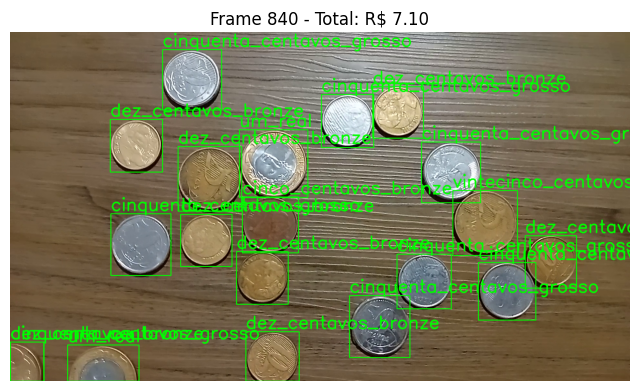


0: 384x640 1 cinco_centavos_bronze, 8 cinquenta_centavos_grossos, 8 dez_centavos_bronzes, 3 um_reals, 2 vintecinco_centavos_bronzes, 519.0ms
Speed: 12.7ms preprocess, 519.0ms inference, 4.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 8 cinquenta_centavos_grossos, 7 dez_centavos_bronzes, 3 um_reals, 2 vintecinco_centavos_bronzes, 554.7ms
Speed: 4.8ms preprocess, 554.7ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 8 cinquenta_centavos_grossos, 7 dez_centavos_bronzes, 2 um_reals, 2 vintecinco_centavos_bronzes, 565.0ms
Speed: 3.7ms preprocess, 565.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 8 cinquenta_centavos_grossos, 7 dez_centavos_bronzes, 4 um_reals, 2 vintecinco_centavos_bronzes, 512.1ms
Speed: 3.7ms preprocess, 512.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 cinco_centavos_bronze, 8 

In [17]:
video_exts = ["*.mp4", "*.avi", "*.mov"]
all_videos = []
for ext in video_exts:
    all_videos.extend(glob.glob(os.path.join(video_folder, ext)))

print(f"\n📂 {len(all_videos)} videos found in {video_folder}")

for vid_path in all_videos:
    process_video(vid_path)